# Data Initialization

In [1]:
import pandas as pd

df=pd.read_csv("dataset.csv")
df=df.drop("Unnamed: 0",axis=1)
df["distance"]=df["distance"].fillna(df["distance"].median())
df["jitter"]=df["jitter"].fillna(df["jitter"].median())
df.head()


,X,Y,throughput,mcs,distance,pktsize,delay,jitter,sinr,power,dlpathloss,pdr
0,146.601387,368.116530,1.743593,13,184.225706,190,3.242855,0.000000,-1.38581,15,-95.2246,99
1,143.260663,365.862937,1.743592,13,188.238131,190,6.579737,1.241554,-3.11075,15,-95.3060,99
2,137.782258,362.167301,1.743593,13,194.819602,190,3.242855,0.000000,-1.24068,15,-95.5003,99
3,131.346059,357.825556,1.743592,13,202.553954,190,6.579767,1.241449,-3.51258,15,-95.8110,99
4,128.942275,355.120683,1.742541,13,206.124022,190,9.782037,1.008803,-3.02864,15,-96.1639,99


In [2]:
import pandas as pd


# Load data

X, y = df[["distance","mcs","pktsize","sinr"]], df.throughput

# Libraries for this section 
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split,KFold,GridSearchCV
from sklearn.metrics import mean_squared_error,r2_score
import numpy as np
import shap
from PyALE import ale
from sklearn.inspection import permutation_importance
from matplotlib import pyplot as plt
from sklearn.preprocessing import StandardScaler
import lime
import lime.lime_tabular
from PyALE._src.ALE_2D import plot_2D_continuous_eff as plt2d

# Main Code Blocks

In [3]:
def Nested_SHAP(p_grid,model):
    #Establish CV scheme
    CV = KFold(n_splits=5, shuffle=True, random_state=10)
    mean_r2,mean_rmse=0,0
    ix_training_outer, ix_test_outer = [], []
    # Loop through each fold and append the training & test indices to the empty lists above
    for fold in CV.split(df):
        ix_training_outer.append(fold[0]), ix_test_outer.append(fold[1])
    permutations_mean=0
    permutations_std=0
    limes1=[]
    limes2=[]
    ales_perfold=[]
    features_per_fold=[]
    SHAP_values_per_fold = [] #-#-#
    ## Loop through each outer fold and extract SHAP values 
    for i, (train_outer_ix, test_outer_ix) in enumerate(zip(ix_training_outer, ix_test_outer)): #-#-#
        #Verbose
        print('\n------ Outer Fold Number:',i)
        X_train, X_test = X.iloc[train_outer_ix, :], X.iloc[test_outer_ix, :]
        y_train, y_test = y.iloc[train_outer_ix], y.iloc[test_outer_ix]

        #Establish inner CV scheme
        CV_inner = KFold(n_splits=5, shuffle=True, random_state=10)
        clf = GridSearchCV(estimator=model, param_grid=p_grid, cv=CV_inner)
        clf.fit(X_train, y_train)
        print("Best parameters:",clf.best_params_)
        fit=clf.best_estimator_.fit(X_train, y_train)
        yhat = fit.predict(X_test)
        result = mean_squared_error(y_test, yhat)
        print('RMSE:',round(np.sqrt(result),4))
        mean_rmse+=np.sqrt(result)/5
        print('R2 Score:',round(r2_score(y_test,yhat),4))
        mean_r2+=r2_score(y_test,yhat)/5
        ## Loop through each inner fold and extract static values
        explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train), feature_names=X_train.columns, class_names=['throughput'],  verbose=False, mode='regression')
        exp = explainer.explain_instance(X.loc[40].values, fit.predict, num_features=4)
        limes1.append(exp)
        exp = explainer.explain_instance(X.loc[770].values, fit.predict, num_features=4)
        limes2.append(exp)
        result = permutation_importance(fit, X_test, y_test, n_repeats=10,
                                random_state=42,scoring="neg_root_mean_squared_error")
        permutations_mean+=result.importances_mean/5
        permutations_std+=result.importances_std/5
        ales_perfold.append(ale(X=X_test, model=fit, feature=["pktsize", "sinr"], grid_size=100,plot=False))
        explainer = shap.Explainer(fit)
        shap_values = explainer(X_test)
        SHAP_values_per_fold.append(shap_values)
        features_per_fold.append(X_test)
        #shap.summary_plot(shap_values,X_test)
    print("Mean RMSE Score:",mean_rmse)
    print("Mean R2 Score:",mean_r2)
    print("Permutation importance mean")
    plt.bar(X.columns,permutations_mean)
    plt.ylabel("Permutation feature importance mean")
    plt.show()
    print("Permutation importance std")
    plt.bar(X.columns,permutations_std)
    plt.ylabel("Permutation feature importance std")
    plt.show()
    return SHAP_values_per_fold,features_per_fold,ales_perfold,limes1,limes2

In [4]:
def mean_lime(limes):
    lcl=limes[0].local_exp
    for i in range(4):
        for z in range(1,5):
            for ix in range(4):
                if limes[z].local_exp[0][ix][0]==lcl[0][i][0]:
                    lcl[0][i]=(lcl[0][i][0],(lcl[0][i][1]*i+limes[z].local_exp[0][ix][1])/(i+1))
                if limes[z].local_exp[1][ix][0]==lcl[1][i][0]:
                    lcl[1][i]=(lcl[1][i][0],(lcl[1][i][1]*i+limes[z].local_exp[1][ix][1])/(i+1))
    limes[0].predicted_value=(limes[0].predicted_value+limes[1].predicted_value+limes[2].predicted_value+limes[3].predicted_value+limes[4].predicted_value)/5
    return limes[0]

## Random Forest Nested CV


------ Outer Fold Number: 0
Best parameters: {'max_depth': 30, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1000}
RMSE: 0.6787
R2 Score: 0.9422


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



------ Outer Fold Number: 1
Best parameters: {'max_depth': 30, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 500}
RMSE: 0.5763
R2 Score: 0.9598


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



------ Outer Fold Number: 2
Best parameters: {'max_depth': 30, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 750}
RMSE: 0.6104
R2 Score: 0.9544


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



------ Outer Fold Number: 3
Best parameters: {'max_depth': 30, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 3, 'n_estimators': 750}
RMSE: 0.7039
R2 Score: 0.9393


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(



------ Outer Fold Number: 4
Best parameters: {'max_depth': 30, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 750}
RMSE: 0.6213
R2 Score: 0.9532


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


Mean RMSE Score: 0.6381412345273988
Mean R2 Score: 0.9497627935854679
Permutation importance mean


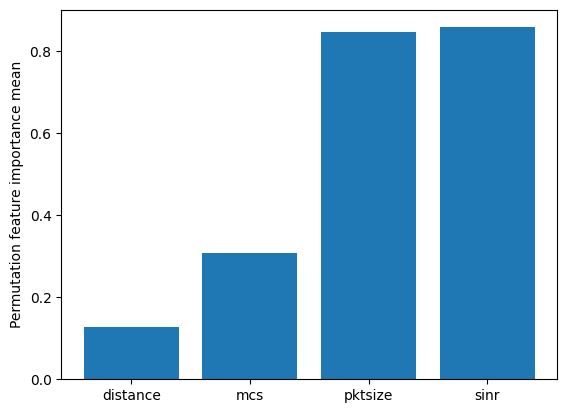

Permutation importance std


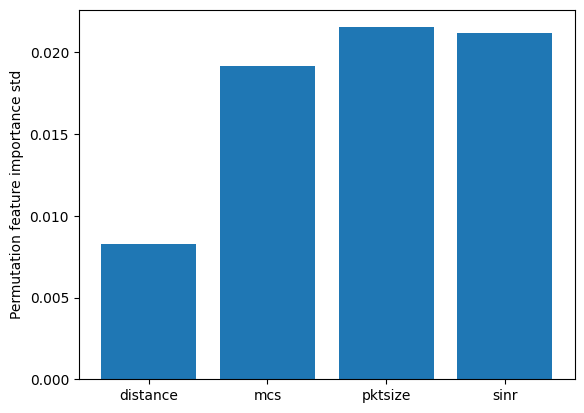

Minimum fold size: 1788


In [15]:
rf_grid={ 'max_depth': [10, 20, 30],
 'max_features': ['log2', 'sqrt'],
 'min_samples_leaf': [1, 2],
 'min_samples_split': [2, 3],
 'n_estimators': [500, 750, 1000]}
SHAP_values_per_fold,features_per_fold,ales,limes1,limes2=Nested_SHAP(rf_grid,RandomForestRegressor(random_state=42))
min_fold_size=min([shv.shape[0] for shv in SHAP_values_per_fold])
print("Minimum fold size:",min_fold_size)
mshap_values=(SHAP_values_per_fold[0][:min_fold_size]+SHAP_values_per_fold[1][:min_fold_size]+SHAP_values_per_fold[2][:min_fold_size]+SHAP_values_per_fold[3][:min_fold_size]+SHAP_values_per_fold[4][:min_fold_size])/5

In [16]:
mean_lime(limes1).show_in_notebook(show_table=True)

In [17]:
mean_lime(limes2).show_in_notebook(show_table=True)

(<Figure size 640x480 with 2 Axes>, <Axes: xlabel='sinr', ylabel='pktsize'>)

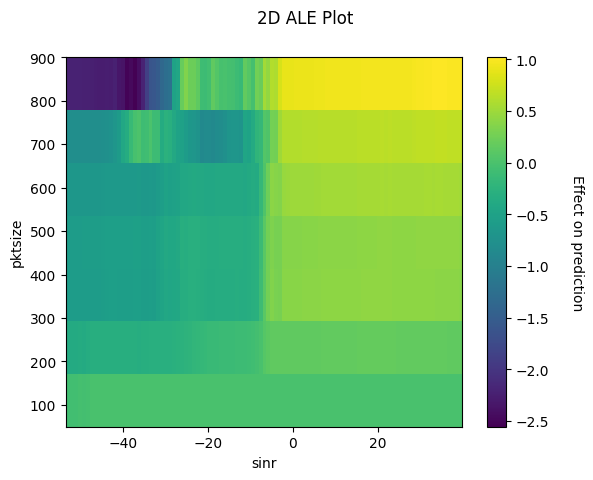

In [18]:
plt2d(pd.DataFrame(data=(np.array(ales[0])+np.array(ales[1])+np.array(ales[2])+np.array(ales[3])+np.array(ales[4]))/5,    
             index=(ales[0].index+ales[1].index+ales[2].index+ales[3].index+ales[4].index)/5,                 
             columns=(ales[0].columns+ales[1].columns+ales[2].columns+ales[3].columns+ales[4].columns)/5))

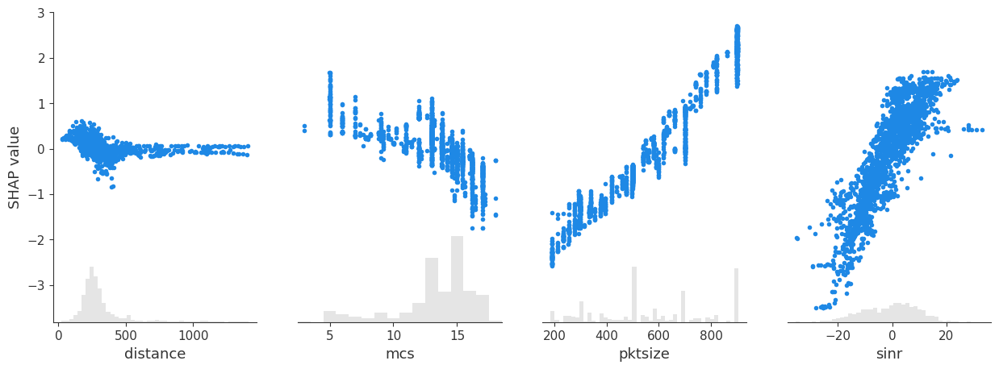

In [19]:
shap.plots.scatter(mshap_values,title="RF SHAP Scatter Plot")

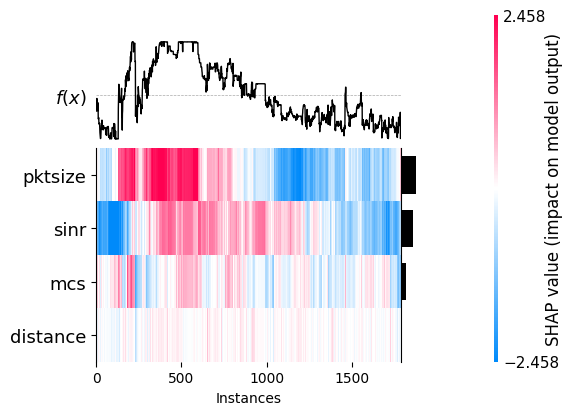

<Axes: xlabel='Instances'>

In [20]:
shap.plots.heatmap(mshap_values,plot_width=12)

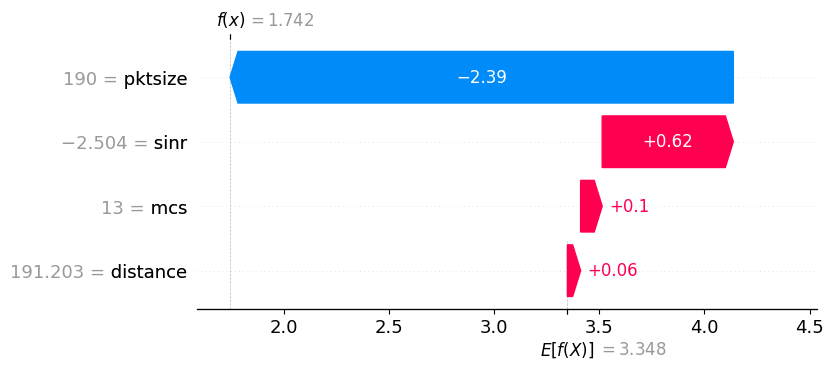

In [21]:
shap.plots.waterfall(mshap_values[0])

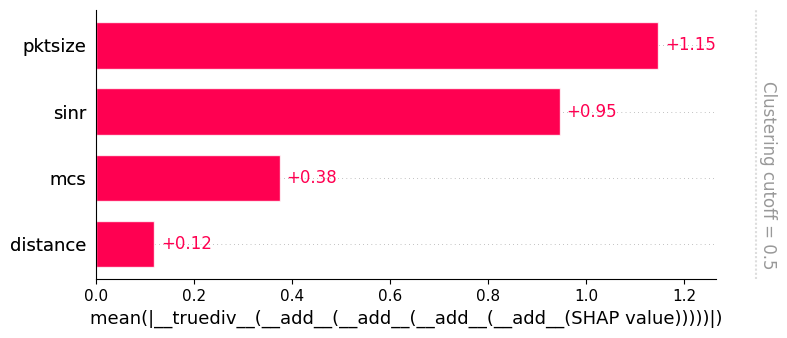

In [22]:
clustering = shap.utils.hclust(X, y)
shap.plots.bar(mshap_values, clustering=clustering, clustering_cutoff=0.5)

## Catboost Nested CV


------ Outer Fold Number: 0
Best parameters: {'depth': 8, 'iterations': 500, 'learning_rate': 0.1}
RMSE: 0.6274
R2 Score: 0.9506

------ Outer Fold Number: 1
Best parameters: {'depth': 8, 'iterations': 500, 'learning_rate': 0.1}
RMSE: 0.5531
R2 Score: 0.9629

------ Outer Fold Number: 2
Best parameters: {'depth': 8, 'iterations': 500, 'learning_rate': 0.1}
RMSE: 0.5748
R2 Score: 0.9595

------ Outer Fold Number: 3
Best parameters: {'depth': 8, 'iterations': 500, 'learning_rate': 0.1}
RMSE: 0.6409
R2 Score: 0.9497

------ Outer Fold Number: 4
Best parameters: {'depth': 12, 'iterations': 500, 'learning_rate': 0.1}
RMSE: 0.6071
R2 Score: 0.9553
Mean RMSE Score: 0.6006550102479082
Mean R2 Score: 0.95561509191104
Permutation importance mean


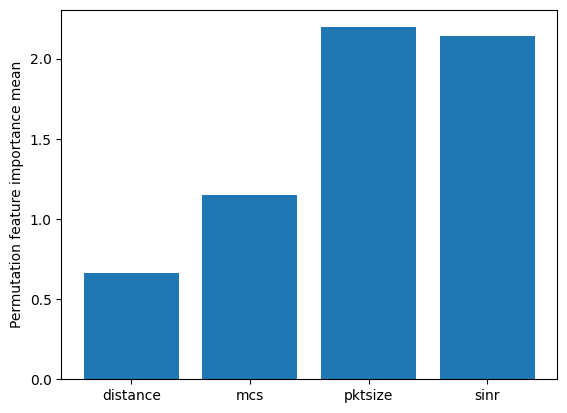

Permutation importance std


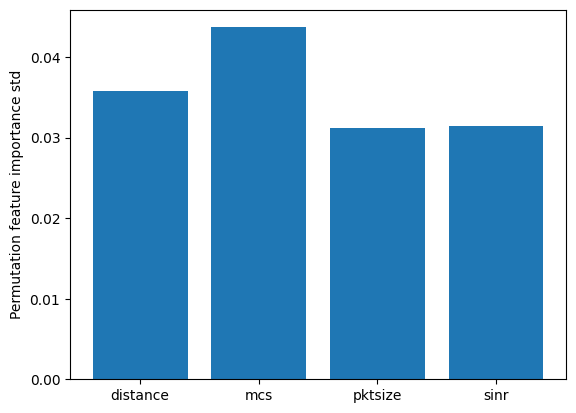

Minimum fold size: 1788


In [5]:
from catboost import CatBoostRegressor 
  
cat_grid={
        "iterations": [500,1000,2500],
        "learning_rate": [1e-1,2e-1],
        "depth":[4,8,12]
    }
SHAP_values_per_fold,features_per_fold,ales,limes1,limes2=Nested_SHAP(cat_grid,CatBoostRegressor(loss_function='RMSE',verbose=0) )


min_fold_size=min([shv.shape[0] for shv in SHAP_values_per_fold]) 
print("Minimum fold size:",min_fold_size)
mshap_values=(SHAP_values_per_fold[0][:min_fold_size]+SHAP_values_per_fold[1][:min_fold_size]+SHAP_values_per_fold[2][:min_fold_size]+SHAP_values_per_fold[3][:min_fold_size]+SHAP_values_per_fold[4][:min_fold_size])/5

In [6]:
mean_lime(limes1).show_in_notebook(show_table=True)

In [7]:
mean_lime(limes2).show_in_notebook(show_table=True)

(<Figure size 640x480 with 2 Axes>, <Axes: xlabel='sinr', ylabel='pktsize'>)

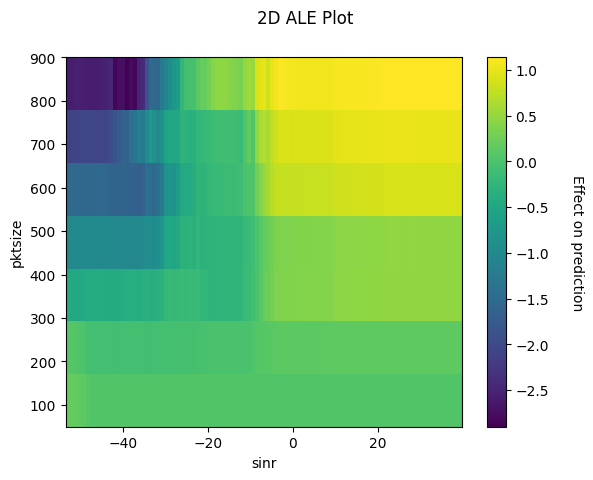

In [10]:
plt2d(pd.DataFrame(data=(np.array(ales[0])+np.array(ales[1])+np.array(ales[2])+np.array(ales[3])+np.array(ales[4]))/5,    
             index=(ales[0].index+ales[1].index+ales[2].index+ales[3].index+ales[4].index)/5,                 
             columns=(ales[0].columns+ales[1].columns+ales[2].columns+ales[3].columns+ales[4].columns)/5))

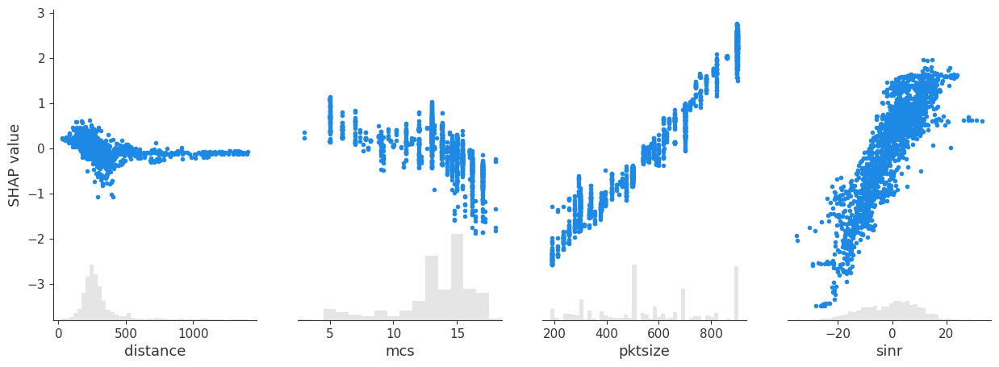

In [11]:
shap.plots.scatter(mshap_values)

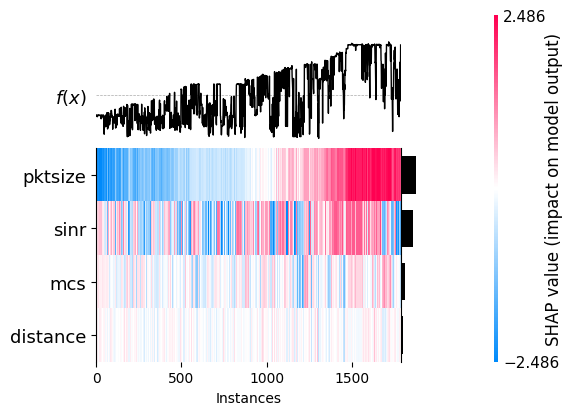

<Axes: xlabel='Instances'>

In [41]:
shap.plots.heatmap(mshap_values,plot_width=12,instance_order=mshap_values.data[:,2].argsort())

In [40]:
mshap_values.data[:,2].argsort()

array([   0, 1067, 1066, ..., 1478, 1504, 1787], dtype=int64)

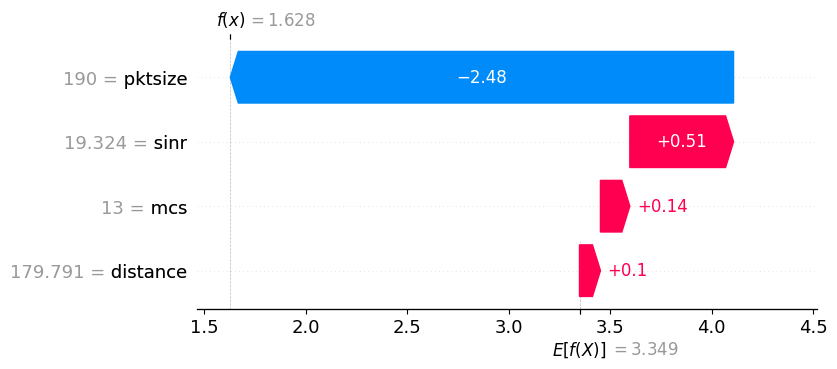

In [13]:
shap.plots.waterfall(mshap_values[5])

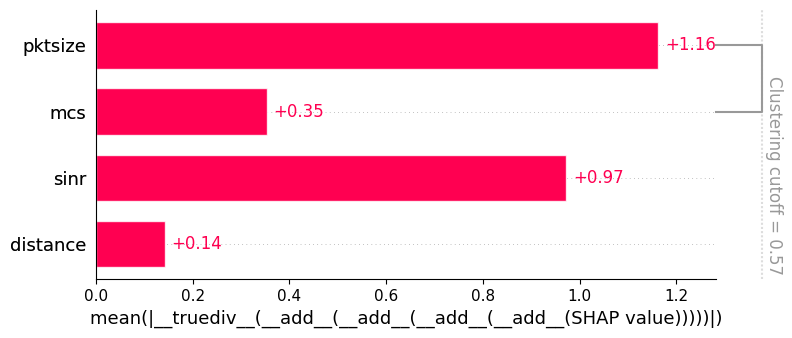

In [44]:
clustering = shap.utils.hclust(X, y)
shap.plots.bar(mshap_values, clustering=clustering, clustering_cutoff=0.57)

## DNN Nested CV

Some of the main function is changed for NNs


------ Outer Fold Number: 0
Best parameters: {'batch_size': 16, 'hidden_layer_sizes': (128, 64, 32), 'solver': 'adam'}
RMSE: 0.7084
R2 Score: 0.937


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


  0%|          | 0/1789 [00:00<?, ?it/s]


------ Outer Fold Number: 1
Best parameters: {'batch_size': 16, 'hidden_layer_sizes': (128, 64, 32), 'solver': 'adam'}
RMSE: 0.651
R2 Score: 0.9486


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


  0%|          | 0/1788 [00:00<?, ?it/s]


------ Outer Fold Number: 2
Best parameters: {'batch_size': 32, 'hidden_layer_sizes': (128, 64, 32), 'solver': 'adam'}
RMSE: 0.6977
R2 Score: 0.9404


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


  0%|          | 0/1788 [00:00<?, ?it/s]


------ Outer Fold Number: 3
Best parameters: {'batch_size': 16, 'hidden_layer_sizes': (128, 64, 32), 'solver': 'adam'}
RMSE: 0.7389
R2 Score: 0.9332


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


  0%|          | 0/1788 [00:00<?, ?it/s]


------ Outer Fold Number: 4
Best parameters: {'batch_size': 16, 'hidden_layer_sizes': (64, 64, 64), 'solver': 'adam'}
RMSE: 0.6903
R2 Score: 0.9422


c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(
c:\Users\Superuser\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but MLPRegressor was fitted with feature names
  warnings.warn(


  0%|          | 0/1788 [00:00<?, ?it/s]

Mean RMSE Score: 0.6972848848052156
Mean R2 Score: 0.940277414953401
Permutation importance mean


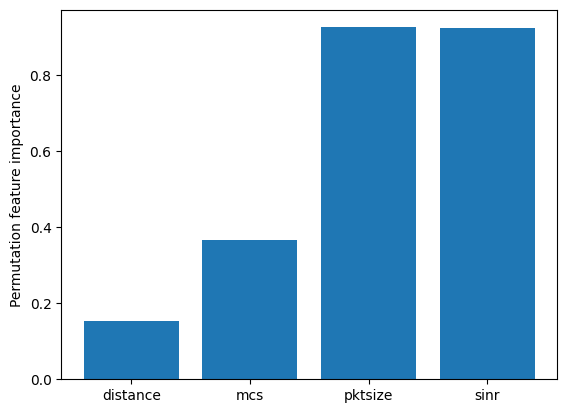

Permutation importance std


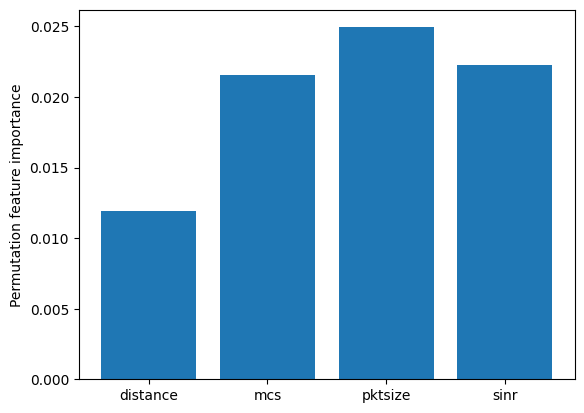

Minimum fold size: 1788


In [32]:
from sklearn.neural_network import MLPRegressor
def Nested_SHAP_NN(p_grid,model):
    #Establish CV scheme
    CV = KFold(n_splits=5, shuffle=True, random_state=10)
    mean_r2,mean_rmse=0,0
    ix_training_outer, ix_test_outer = [], []
    # Loop through each fold and append the training & test indices to the empty lists above
    for fold in CV.split(df):
        ix_training_outer.append(fold[0]), ix_test_outer.append(fold[1])
    permutations_mean=0
    permutations_std=0
    limes1=[]
    limes2=[]
    ales_perfold=[]
    features_per_fold=[]
    SHAP_values_per_fold = [] #-#-#
    scaler = StandardScaler()
    scaled_x=scaler.fit_transform(X)
    scaled_features_df = pd.DataFrame(scaled_x, index=X.index, columns=X.columns)

    ## Loop through each outer fold and extract SHAP values 
    for i, (train_outer_ix, test_outer_ix) in enumerate(zip(ix_training_outer, ix_test_outer)): #-#-#
        #Verbose
        print('\n------ Outer Fold Number:',i)
        X_train, X_test = scaled_features_df.iloc[train_outer_ix, :], scaled_features_df.iloc[test_outer_ix, :]
        y_train, y_test = y.iloc[train_outer_ix], y.iloc[test_outer_ix]

        #Establish inner CV scheme
        CV_inner = KFold(n_splits=5, shuffle=True, random_state=10)
        clf = GridSearchCV(estimator=model, param_grid=p_grid, cv=CV_inner)
        clf.fit(X_train, y_train)
        print("Best parameters:",clf.best_params_)
        fit=clf.best_estimator_
        fit.fit(X_train, y_train)
        yhat = fit.predict(X_test)
        result = mean_squared_error(y_test, yhat)
        print('RMSE:',round(np.sqrt(result),4))
        mean_rmse+=np.sqrt(result)/5
        print('R2 Score:',round(r2_score(y_test,yhat),4))
        mean_r2+=r2_score(y_test,yhat)/5
        ## Loop through each inner fold and extract static values
        explainer = lime.lime_tabular.LimeTabularExplainer(np.array(X_train), feature_names=X_train.columns, class_names=['throughput'],  verbose=False, mode='regression')
        exp = explainer.explain_instance(X.loc[40].values, fit.predict, num_features=4)
        limes1.append(exp)
        exp = explainer.explain_instance(X.loc[770].values, fit.predict, num_features=4)
        limes2.append(exp)
        result = permutation_importance(fit, X_test, y_test, n_repeats=10,
                                random_state=42)
        permutations_mean+=result.importances_mean/5
        permutations_std+=result.importances_std/5
        ales_perfold.append(ale(X=X_test, model=fit, feature=["pktsize", "sinr"], grid_size=100,plot=False))
        explainer = shap.KernelExplainer(fit.predict,data=shap.kmeans(X_train, 100))
        shap_values = explainer(X_test)
        SHAP_values_per_fold.append(shap_values)
        features_per_fold.append(X_test)
        #shap.summary_plot(shap_values,X_test)
    print("Mean RMSE Score:",mean_rmse)
    print("Mean R2 Score:",mean_r2)
    print("Permutation importance mean")
    plt.bar(X.columns,permutations_mean)
    plt.ylabel("Permutation feature importance")
    plt.show()
    print("Permutation importance std")
    plt.bar(X.columns,permutations_std)
    plt.ylabel("Permutation feature importance")
    plt.show()
    return SHAP_values_per_fold,features_per_fold,ales_perfold,limes1,limes2
MLP_grid={
        "hidden_layer_sizes": [(128,64,32),(64,64,64),(32,32,32,32)],
        "solver": ["sgd", "adam"],
        "batch_size":[16,32,64]
    }
SHAP_values_per_fold,features_per_fold,ales,limes1,limes2=Nested_SHAP_NN(MLP_grid,MLPRegressor(random_state=42,learning_rate_init=0.0001, max_iter=10000,tol=0.001,activation="relu") )

min_fold_size=min([shv.shape[0] for shv in SHAP_values_per_fold])
print("Minimum fold size:",min_fold_size)
mshap_values=(SHAP_values_per_fold[0][:min_fold_size]+SHAP_values_per_fold[1][:min_fold_size]+SHAP_values_per_fold[2][:min_fold_size]+SHAP_values_per_fold[3][:min_fold_size]+SHAP_values_per_fold[4][:min_fold_size])/5

In [33]:
mean_lime(limes1).show_in_notebook(show_table=True)

In [34]:
mean_lime(limes2).show_in_notebook(show_table=True)

(<Figure size 640x480 with 2 Axes>, <Axes: xlabel='sinr', ylabel='pktsize'>)

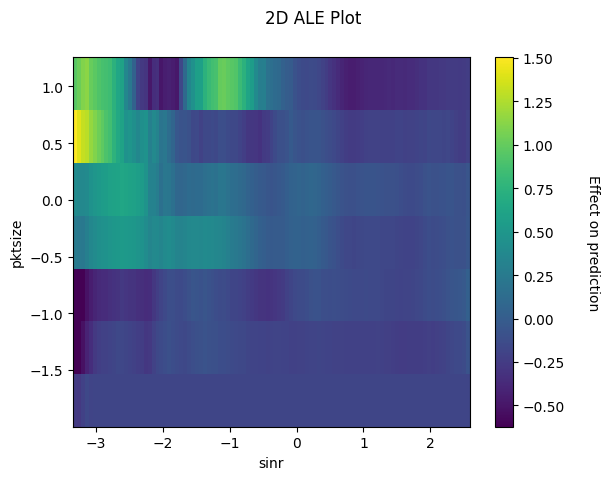

In [35]:
plt2d(pd.DataFrame(data=(np.array(ales[0])+np.array(ales[1])+np.array(ales[2])+np.array(ales[3])+np.array(ales[4]))/5,    
             index=(ales[0].index+ales[1].index+ales[2].index+ales[3].index+ales[4].index)/5,                 
             columns=(ales[0].columns+ales[1].columns+ales[2].columns+ales[3].columns+ales[4].columns)/5))

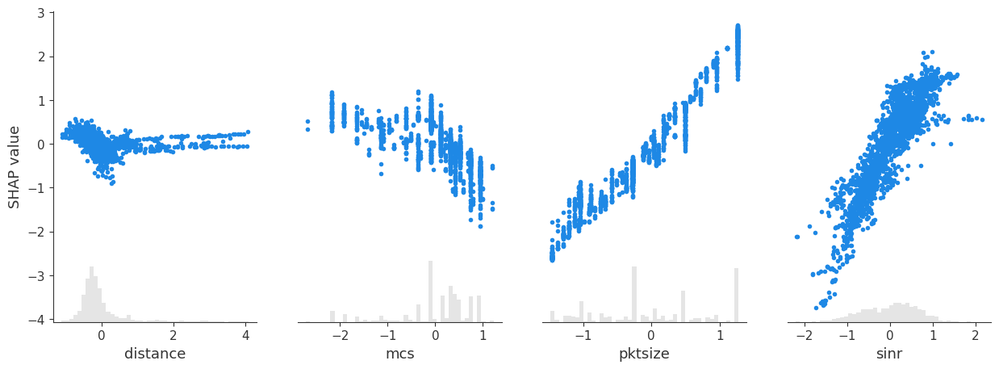

In [36]:
shap.plots.scatter(mshap_values)

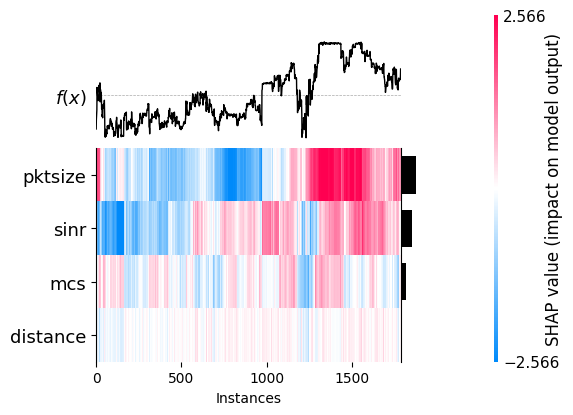

<Axes: xlabel='Instances'>

In [37]:
shap.plots.heatmap(mshap_values,plot_width=12)

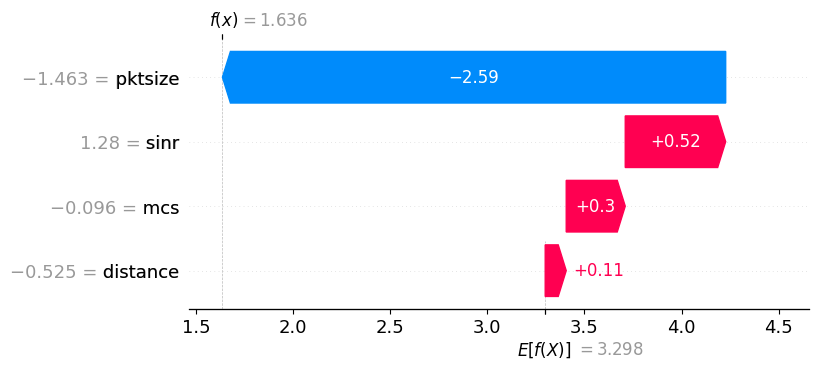

In [38]:
shap.plots.waterfall(mshap_values[5])

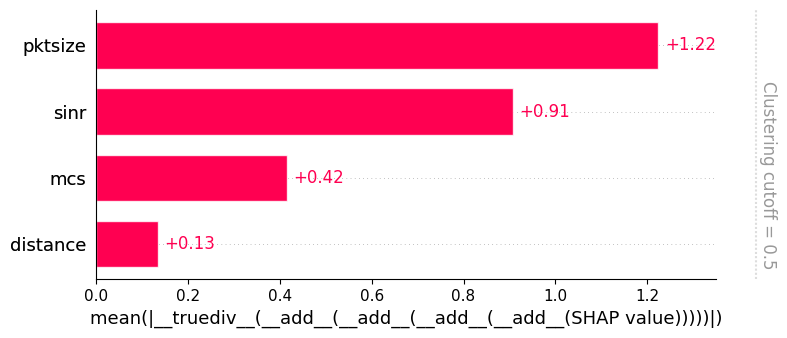

In [39]:
clustering = shap.utils.hclust(X, y)
shap.plots.bar(mshap_values, clustering=clustering, clustering_cutoff=0.5)